In [74]:
import matplotlib.pyplot as plt

def print_response(response, ax):
    ax.imshow(response)
    plt.axis('off')

generating images:   0%|          | 0/20 [00:00<?, ?it/s]

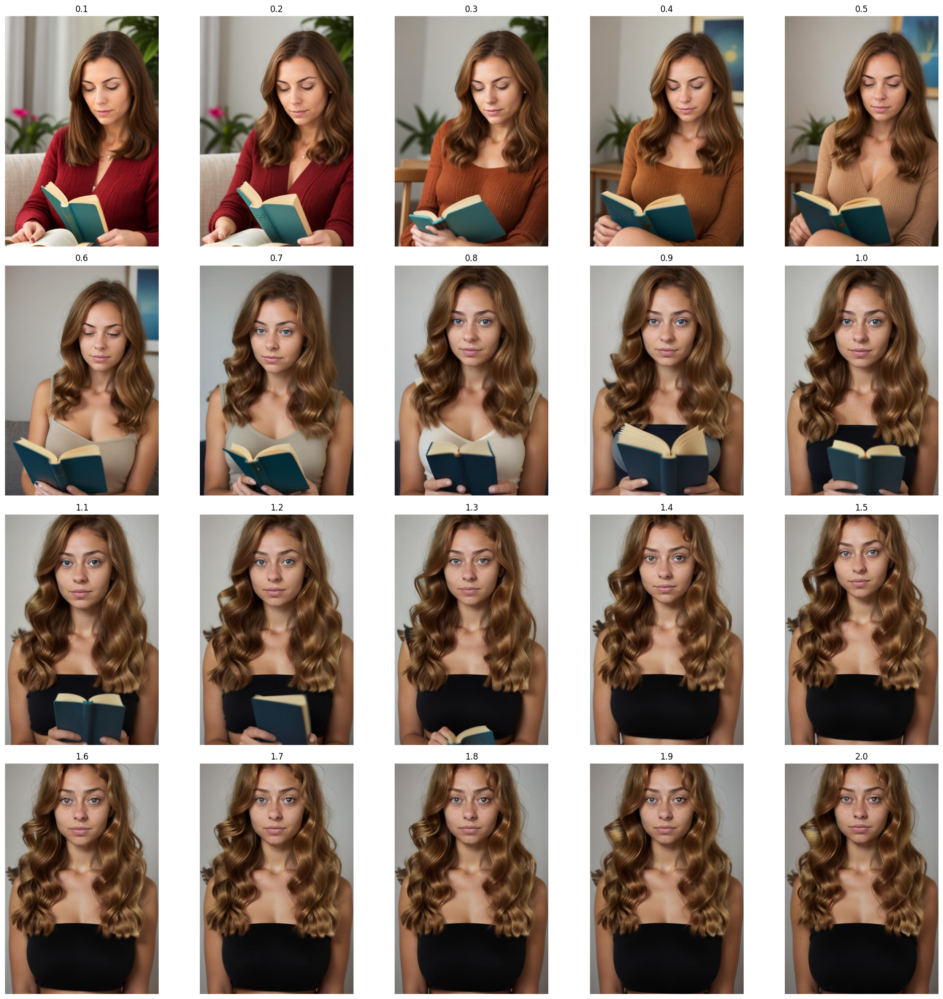

In [79]:
from huggingface_hub import InferenceClient
import base64
from tqdm.notebook import tqdm

plt.figure(figsize=(20, 20))

client = InferenceClient("http://localhost:7777/models/ip-plus")
for scale in tqdm(range(1, 21), total=20, desc='generating images'):
    response = client.image_to_image(
        "./assets/modelmanagement-com-2.jpg",
        prompt="photo of woman reading a book",
        negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality, blurry",
        width=512,
        height=768,
        num_inference_steps=50,
        seed=42,
        scale=scale / 20,
    )
    ax = plt.subplot(4, 5, scale)
    ax.set_title(f'{scale/20}')
    print_response(response, ax)
plt.tight_layout()
plt.show()

In [83]:
from huggingface_hub import InferenceClient
import base64
from tqdm.notebook import tqdm

plt.figure(figsize=(100, 100))

client = InferenceClient("http://localhost:7777/models/ip-plus")
for scale in tqdm(range(1, 21), total=20, desc='generating images'):
    response = client.image_to_image(
        "./assets/modelmanagement-com-2.jpg",
        prompt="woman in black top smiling into the camera",
        negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality, blurry",
        width=512,
        height=768,
        num_inference_steps=50,
        seed=42,
        scale=scale / 20,
    )
    ax = plt.subplot(4, 5, scale)
    ax.set_title(f'{scale/20}')
    print_response(response, ax)
plt.tight_layout()
plt.savefig('test.png')
plt.show()

generating images:   0%|          | 0/20 [00:00<?, ?it/s]

In [81]:
plt.savefig('test.png')

<Figure size 640x480 with 0 Axes>

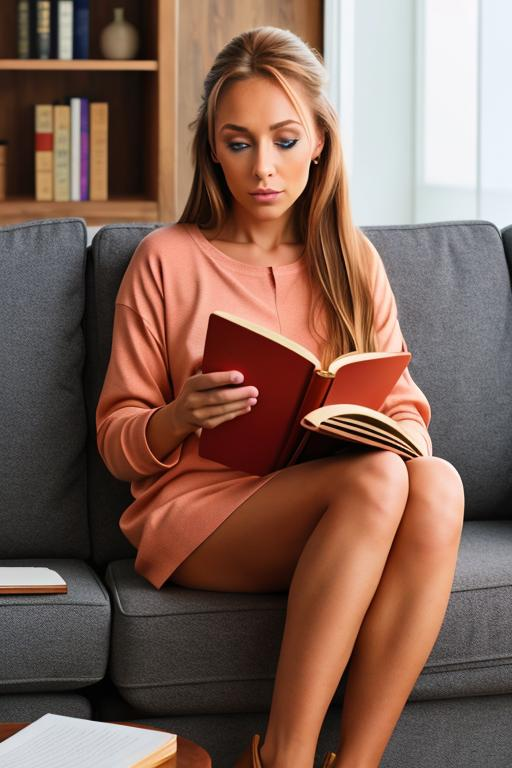

In [46]:
from huggingface_hub import InferenceClient
import base64

client = InferenceClient("http://localhost:7777/models/ip-faces-portrait-multi/")
images = [
    "modelmanagement-com.jpg",
    "modelmanagement-com-2.jpg",
    "modelmanagement-com-3.jpg",
    "modelmanagement-com-4.jpg",
    "modelmanagement-com-5.jpg",
]

payload_images = []
for img in images:
  with open('./assets/' + img, "rb") as image_file:
    payload_images.append(base64.b64encode(image_file.read()).decode('ascii'))

response = client.image_to_image(
    b'foo',
    prompt="high quality, woman sitting on couch reading a book",
    negative_prompt="monochrome, lowres, bad anatomy, worst quality, low quality, blurry",
    images=payload_images,
    width=512,
    height=768,
    num_inference_steps=50,
    seed=2023,
    s_scale=1.8
)
response